In [1]:

from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense , ZeroPadding2D
from keras.applications import vgg19
from keras.models import Model, Sequential
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Lambda, Dropout, merge
import numpy as np
import keras.backend as K
from keras.models import load_model
from keras.optimizers import *
from keras.losses import binary_crossentropy
from keras.utils import to_categorical
from keras.layers import concatenate,Conv2DTranspose
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
from keras.regularizers import l2
from keras.models import Model, Sequential
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Lambda, Dropout, merge, MaxPool2D
import numpy as np
import keras.backend as K
from keras.models import load_model
from keras.optimizers import *
from keras.losses import binary_crossentropy
from keras.utils import to_categorical
from keras.layers import concatenate,Conv2DTranspose
from keras.preprocessing.image import ImageDataGenerator
K.set_image_dim_ordering('tf')
from keras.callbacks import ModelCheckpoint
from keras.regularizers import l2
from keras.backend.tensorflow_backend import set_session
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.3
config.gpu_options.allow_growth = True
set_session(tf.Session(config=config))
smooth = 1.
def focal_loss(gamma=2., alpha=.25):
    def focal_loss_fixed(y_true, y_pred):
        pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
        return -K.sum(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1))-K.sum((1-alpha) * K.pow( pt_0, gamma) * K.log(1. - pt_0))
    return focal_loss_fixed
#labels = to_categorical(y=labels,n)
import tensorflow as tf
smooth = 1.
def mean_iou(y_true, y_pred):
    prec = []
    for t in np.arange(0.5, 1.0, 0.05):
        y_pred_ = tf.to_int32(y_pred > t)
        score, up_opt = tf.metrics.mean_iou(y_true, y_pred_, 2)
        K.get_session().run(tf.local_variables_initializer())
        with tf.control_dependencies([up_opt]):
            score = tf.identity(score)
        prec.append(score)
    return K.mean(K.stack(prec), axis=3)
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def bce_dice(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred)-K.log(dice_coef(y_true, y_pred))
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

def jacard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

/home/ubuntu/.local/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
model = applications.VGG19(include_top=False,input_shape=(256,324,3))
model.load_weights('/home/ubuntu/.keras/models/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')
x = model.get_layer('block5_conv4').output

x = Conv2D(256,(5,5),name = 'pred_32s',kernel_initializer='he_normal',padding='same',activation='relu')(x)
x = Dropout(0.5)(x)
x = Conv2D(256,(5,5),name = 'pred_32s1',kernel_initializer='he_normal',padding='same',activation='relu')(x)
x = Conv2DTranspose(128, (4, 4), strides=(4, 4), padding='same',kernel_initializer='he_normal',activation='relu')(x)
x = Conv2D(filters=128,activation='relu',dilation_rate=(1,1),kernel_size=(3,3),padding='same',kernel_regularizer=l2(1e-4))(x)
x = Dropout(0.5)(x)
x = Conv2D(filters=128,activation='relu',dilation_rate=(1,1),kernel_size=(3,3),padding='same',kernel_regularizer=l2(1e-4))(x)

x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same',kernel_initializer='he_normal',activation='relu')(x)
x = Conv2D(filters=64,activation='relu',kernel_size=(3,3),padding='same',kernel_regularizer=l2(1e-4))(x)
x = Dropout(0.2)(x)
x = Conv2D(filters=64,activation='relu',kernel_size=(3,3),padding='same',kernel_regularizer=l2(1e-4))(x)
x = ZeroPadding2D(padding=(0,1))(x)
x = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same',kernel_initializer='he_normal',activation='relu')(x)
x = Conv2D(filters=32,activation='relu',kernel_size=(3,3),dilation_rate=(3,3),padding='same',kernel_regularizer=l2(1e-4))(x)
x = Dropout(0.2)(x)
x = Conv2D(filters=32,activation='relu',kernel_size=(1,1),padding='same',kernel_regularizer=l2(1e-4))(x)
x = Conv2D(filters=1,activation='sigmoid',kernel_size=(1,1),dilation_rate=(1,1),padding='same',kernel_regularizer=l2(1e-4))(x)

model1 = Model(inputs=model.input,outputs=x)


In [3]:
for layers in model.layers:
    layers.trainable=False

In [4]:
listTrainable = ["block1_conv1","block1_conv2","block2_conv1","block2_conv2","block3_conv1","block3_conv2","block3_conv3"]

In [5]:

#loss = focal_loss()
print(model1.summary())

model1.compile(optimizer=RMSprop(lr=1e-6,decay=1e-7), loss=bce_dice, metrics=[dice_coef,jacard_coef])
checkpoint = ModelCheckpoint(filepath='/home/ubuntu/DeepMobile/models/myown/VGGNEWNEW2-focal_loss.h5',mode='max',
                           monitor='val_jacard_coef',verbose=1,save_best_only=True)
model1.load_weights('/home/ubuntu/DeepMobile/models/myown/VGGNEWNEW1.h5')
# we create two instances with the same arguments
data_gen_args = dict(rotation_range=90.,
                     width_shift_range=0.1,
                     height_shift_range=0.1,
                     zoom_range=0.2)
image_datagen = ImageDataGenerator(rescale=1/255.,**data_gen_args)
mask_datagen = ImageDataGenerator(rescale=1/255.,**data_gen_args)
mask_datagen1 = ImageDataGenerator(**data_gen_args)

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 30

image_generator = image_datagen.flow_from_directory(
    '/home/ubuntu/DeepMobile/data/colour_data/train_data/',target_size=(256, 324),
    class_mode=None, batch_size=1,color_mode='rgb',
    seed=seed)

mask_generator = mask_datagen.flow_from_directory(
    '/home/ubuntu/DeepMobile/data/colour_data/label_data/',
    class_mode=None,batch_size=1,target_size=(256, 324),color_mode='grayscale',
    seed=seed)
image_generator1 = image_datagen.flow_from_directory(
    '/home/ubuntu/DeepMobile/data/NewData1/JPEGImages/',target_size=(256, 324),
    class_mode=None, batch_size=1,
    seed=seed)

mask_generator1 = mask_datagen1.flow_from_directory(
    '/home/ubuntu/DeepMobile/data/NewData1/SegmentationClass/',
    class_mode=None,batch_size=1,target_size=(256, 324),color_mode='grayscale',
    seed=seed)

# combine generators into one which yields image and masks
train_generator = zip(image_generator, mask_generator)
valid_generator = zip(image_generator1, mask_generator1)
model1.fit_generator(
    train_generator,validation_data=valid_generator,validation_steps=50,
    steps_per_epoch=1000,callbacks=[checkpoint],
    epochs=100)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 324, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 256, 324, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 256, 324, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 128, 162, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 128, 162, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 128, 162, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 64, 81, 128)       0         
__________

KeyboardInterrupt: 

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


/home/ubuntu/.local/lib/python3.5/site-packages/skimage/io/_plugins/matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
/home/ubuntu/.local/lib/python3.5/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


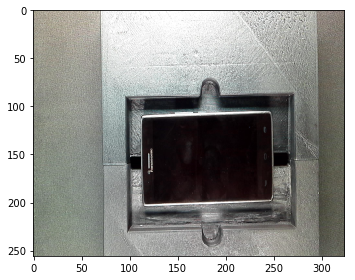

(1, 256, 324, 1)


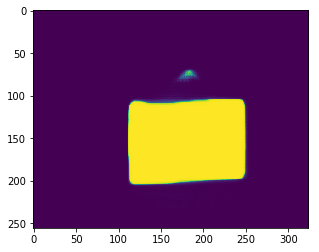

(12751, 3)


/home/ubuntu/.local/lib/python3.5/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image data range; displaying image with stretched contrast.
  warn("Low image data range; displaying image with "


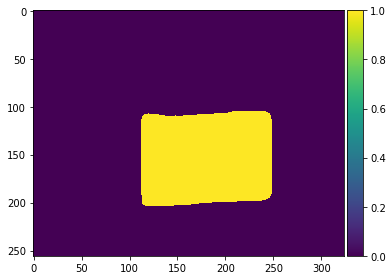

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


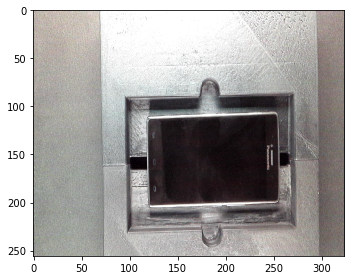

(1, 256, 324, 1)


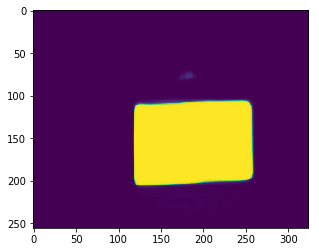

(12891, 3)


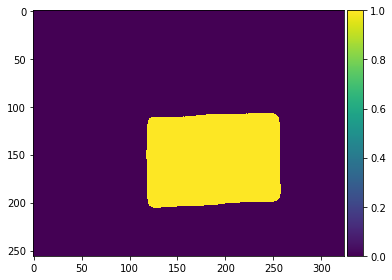

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.9882353 0.0
(1, 256, 324, 3)


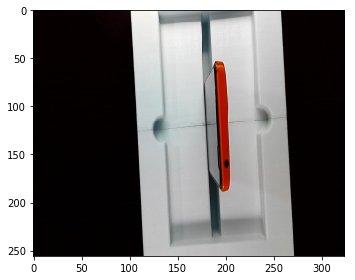

(1, 256, 324, 1)


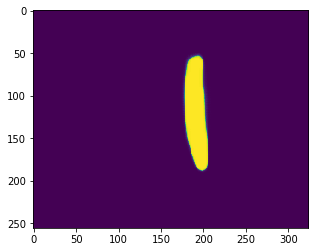

(2647, 3)


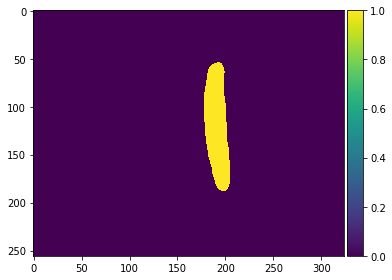

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


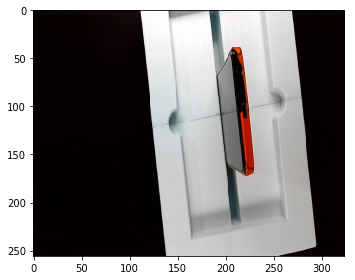

(1, 256, 324, 1)


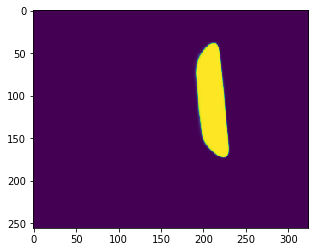

(3519, 3)


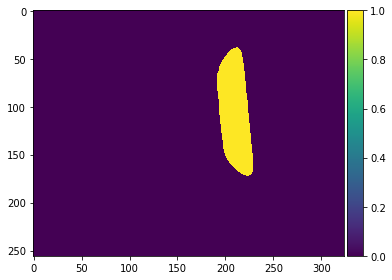

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


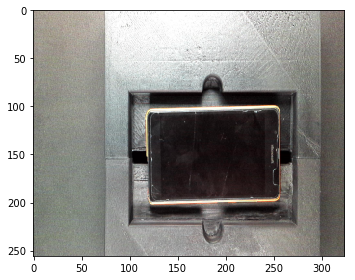

(1, 256, 324, 1)


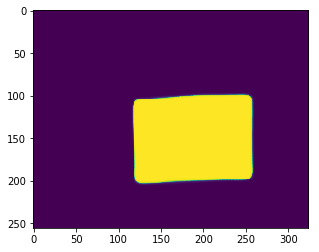

(13605, 3)


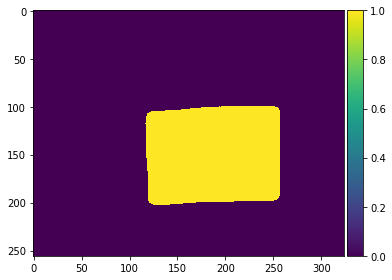

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.85882354 0.0
(1, 256, 324, 3)


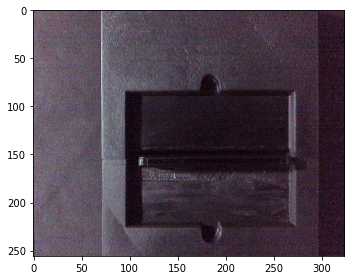

(1, 256, 324, 1)


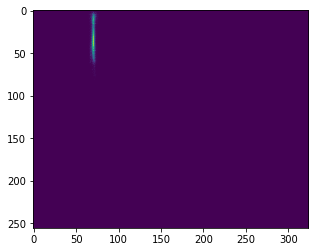

(0, 3)


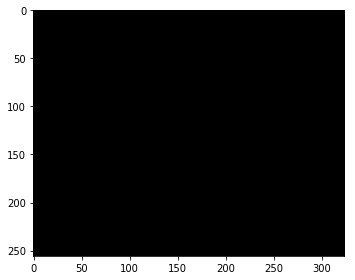

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


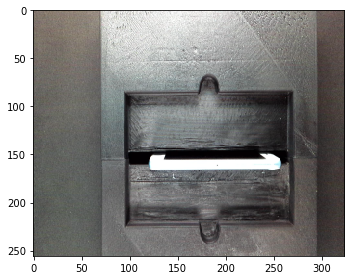

(1, 256, 324, 1)


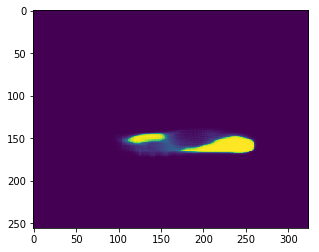

(1148, 3)


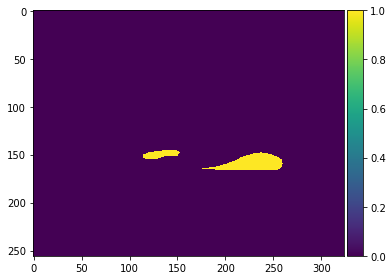

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


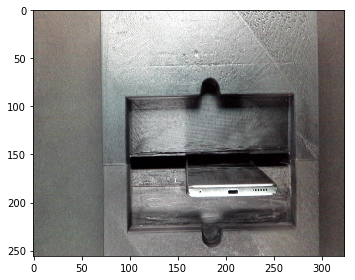

(1, 256, 324, 1)


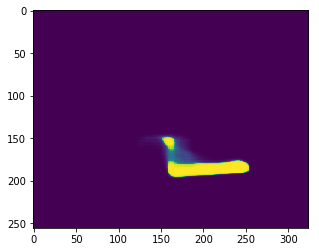

(1375, 3)


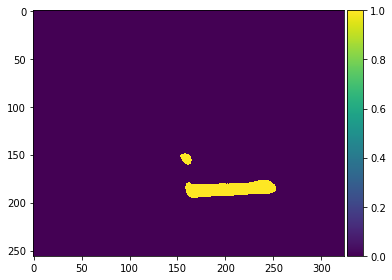

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


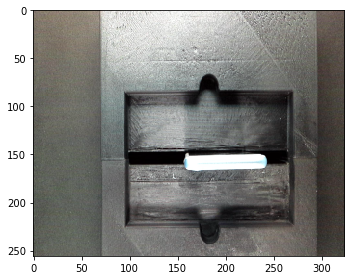

(1, 256, 324, 1)


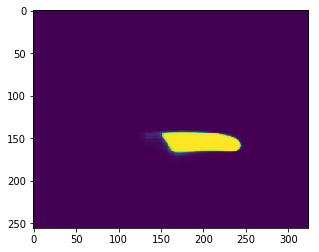

(1694, 3)


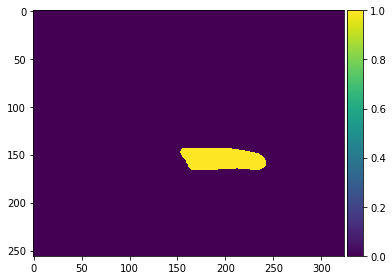

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.8745098 0.0
(1, 256, 324, 3)


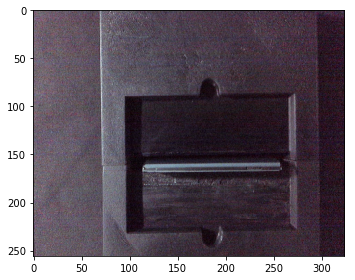

(1, 256, 324, 1)


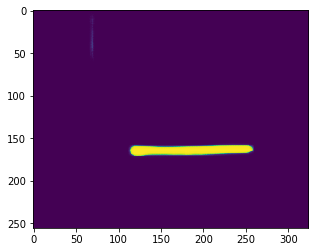

(1188, 3)


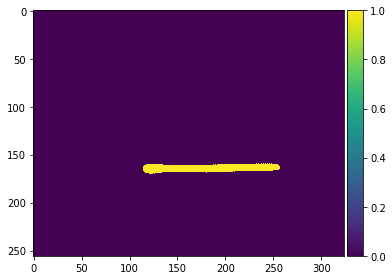

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


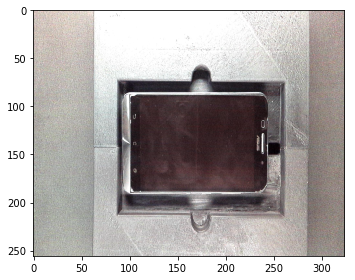

(1, 256, 324, 1)


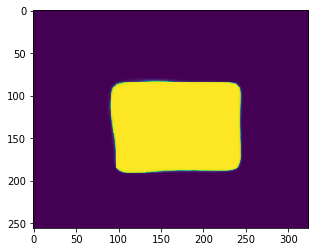

(15337, 3)


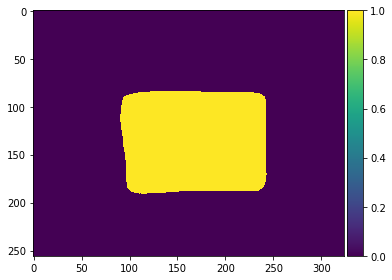

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.91764706 0.0
(1, 256, 324, 3)


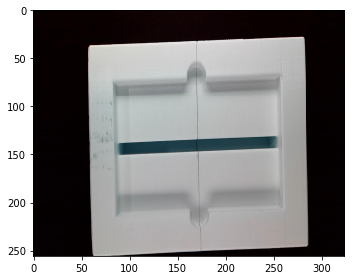

(1, 256, 324, 1)


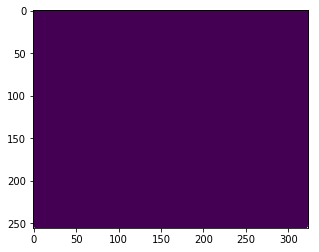

(0, 3)


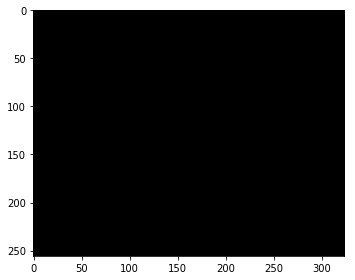

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


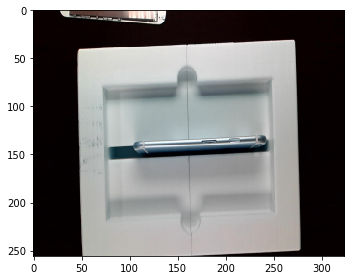

(1, 256, 324, 1)


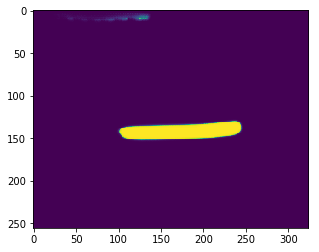

(2171, 3)


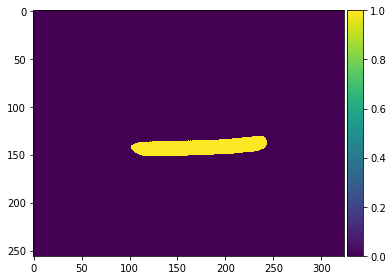

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.011764706
(1, 256, 324, 3)


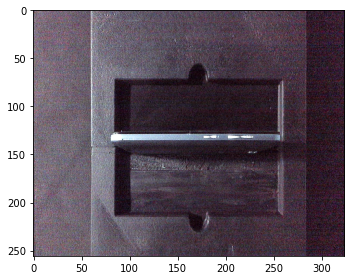

(1, 256, 324, 1)


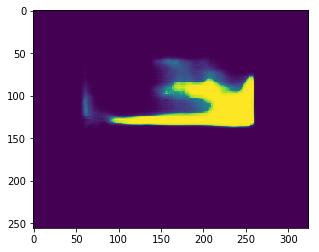

(3976, 3)


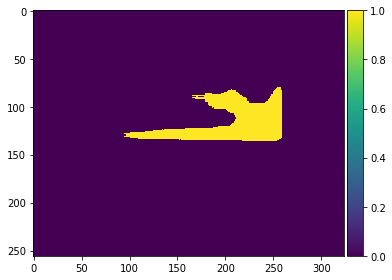

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


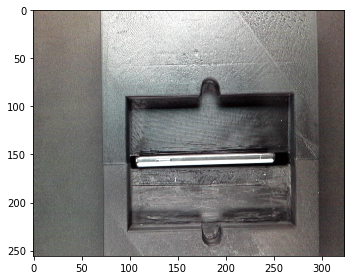

(1, 256, 324, 1)


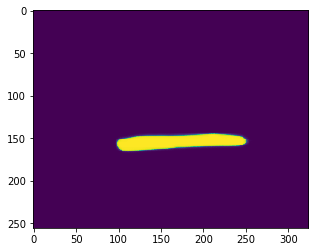

(1975, 3)


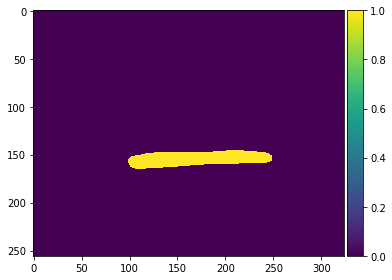

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


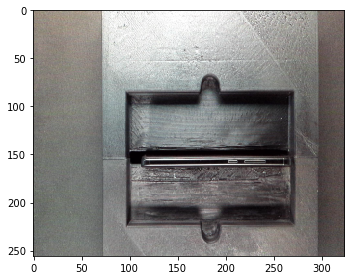

(1, 256, 324, 1)


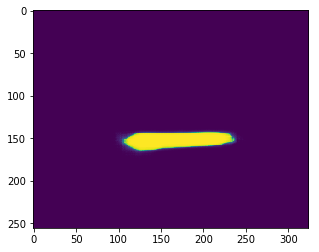

(1919, 3)


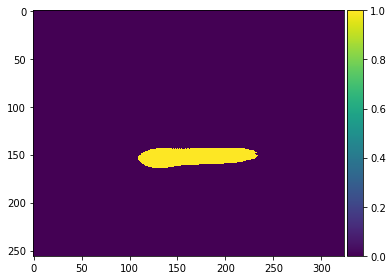

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.9607843 0.0
(1, 256, 324, 3)


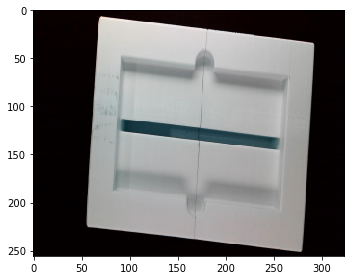

(1, 256, 324, 1)


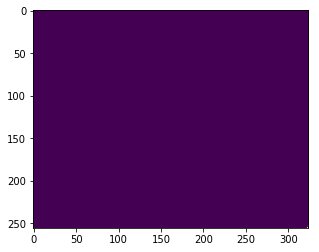

(0, 3)


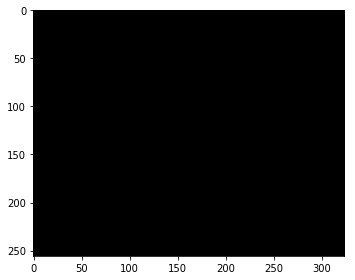

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


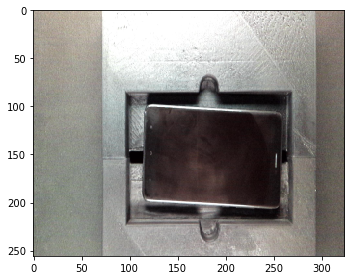

(1, 256, 324, 1)


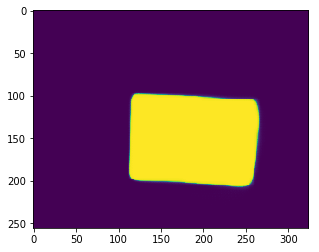

(14864, 3)


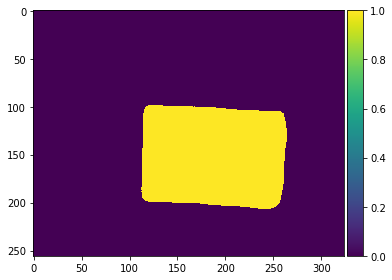

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


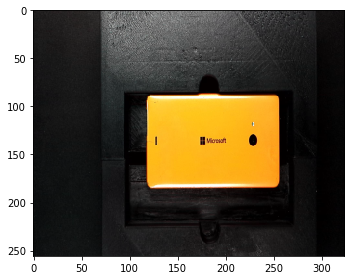

(1, 256, 324, 1)


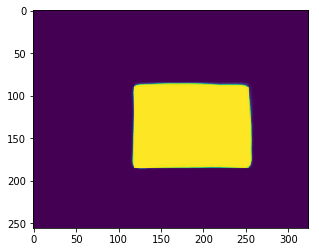

(13317, 3)


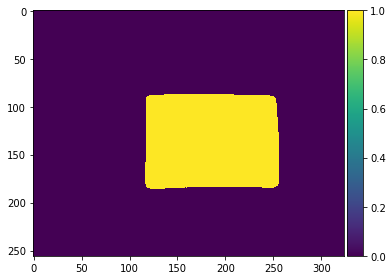

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.8862745 0.003921569
(1, 256, 324, 3)


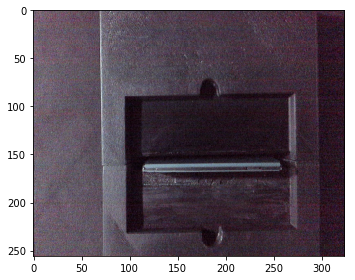

(1, 256, 324, 1)


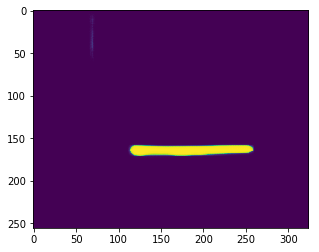

(1268, 3)


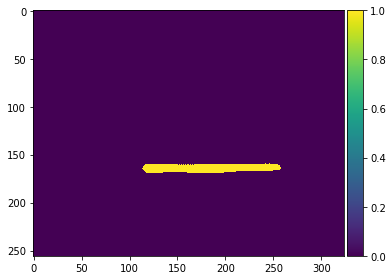

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


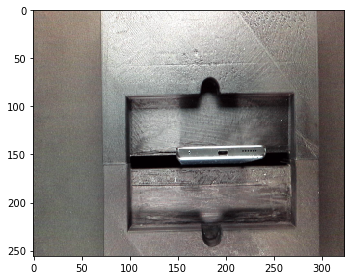

(1, 256, 324, 1)


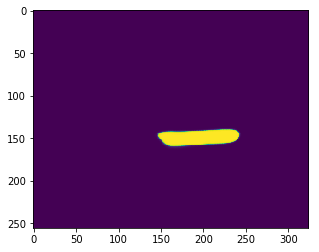

(1388, 3)


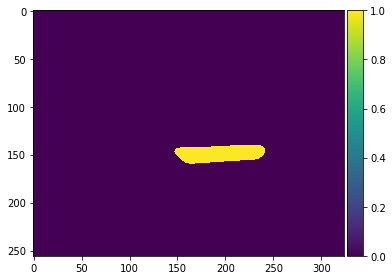

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


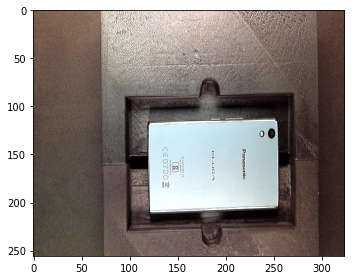

(1, 256, 324, 1)


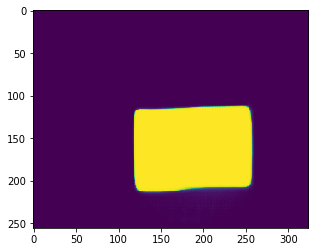

(12955, 3)


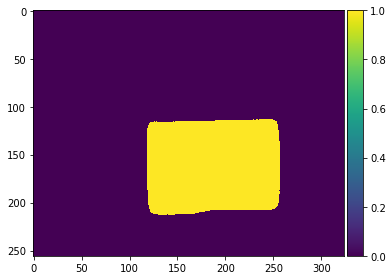

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.9764706 0.0
(1, 256, 324, 3)


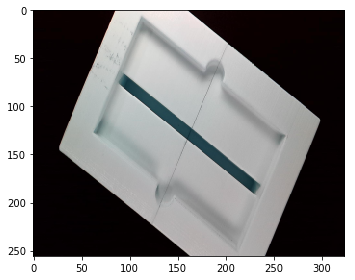

(1, 256, 324, 1)


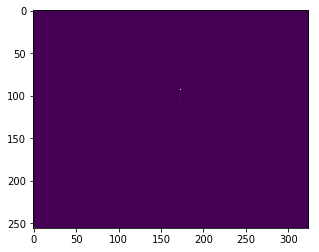

(0, 3)


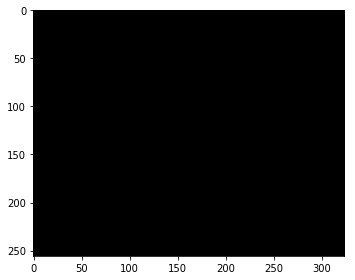

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.99607843 0.0
(1, 256, 324, 3)


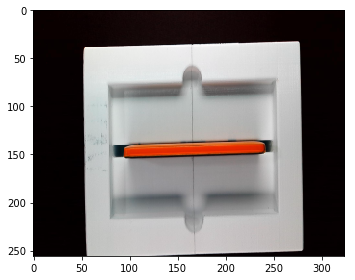

(1, 256, 324, 1)


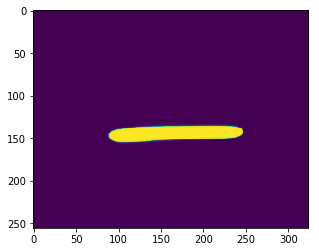

(2277, 3)


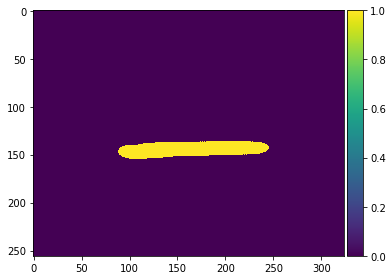

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


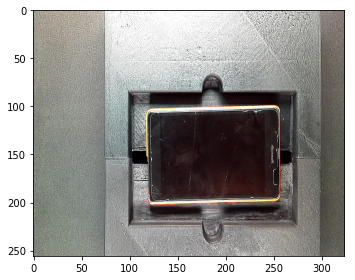

(1, 256, 324, 1)


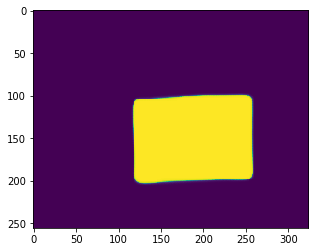

(13593, 3)


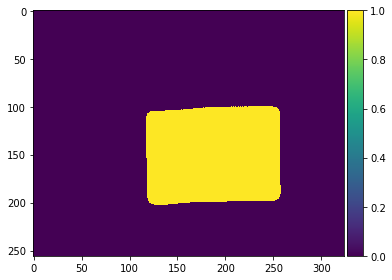

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


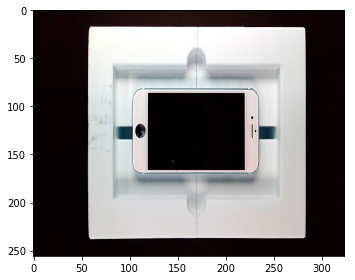

(1, 256, 324, 1)


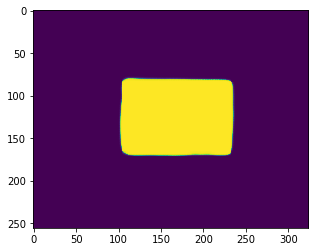

(11529, 3)


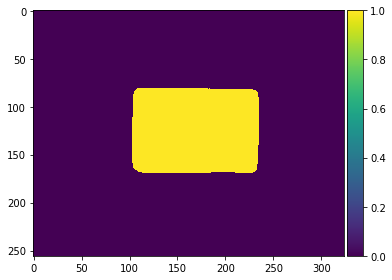

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.9490196 0.0
(1, 256, 324, 3)


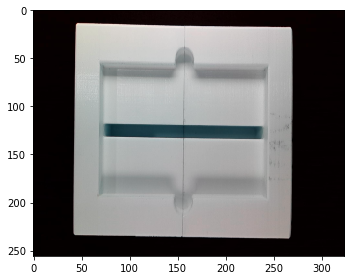

(1, 256, 324, 1)


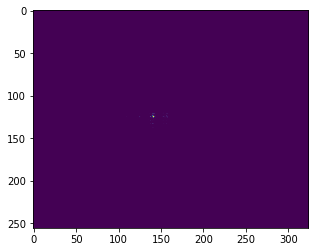

(0, 3)


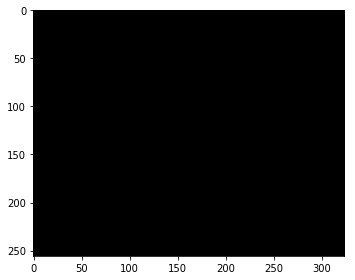

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


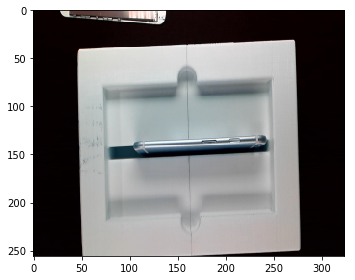

(1, 256, 324, 1)


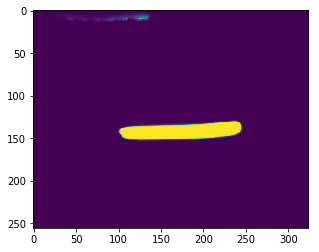

(2181, 3)


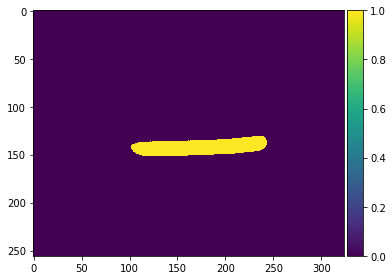

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.94509804 0.0
(1, 256, 324, 3)


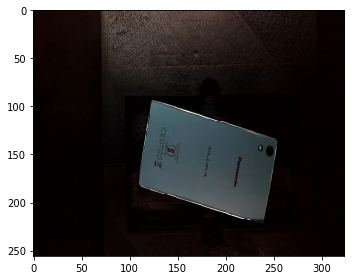

(1, 256, 324, 1)


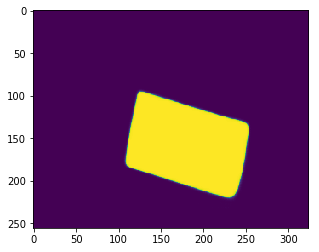

(12211, 3)


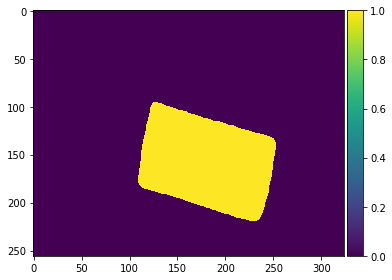

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


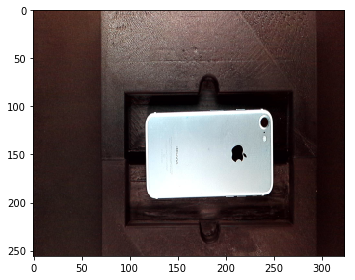

(1, 256, 324, 1)


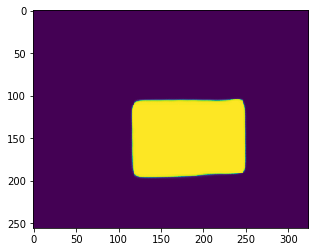

(11518, 3)


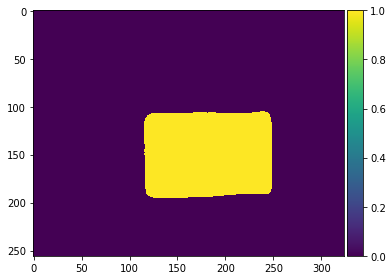

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


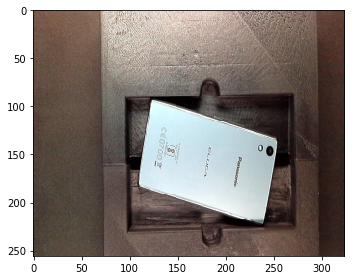

(1, 256, 324, 1)


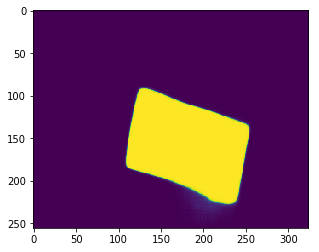

(12969, 3)


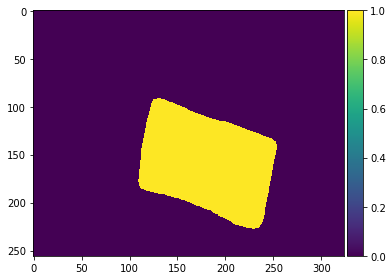

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


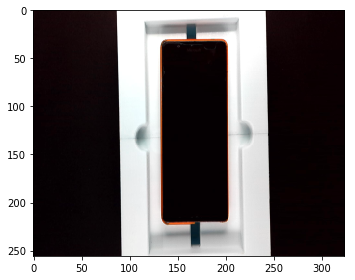

(1, 256, 324, 1)


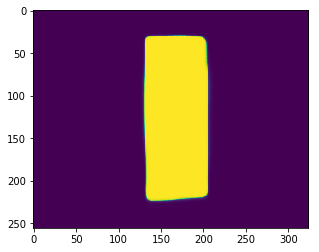

(13858, 3)


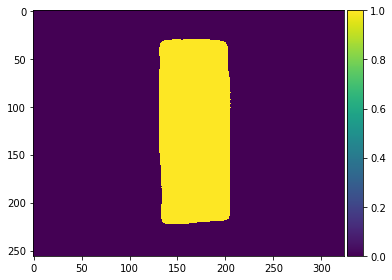

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


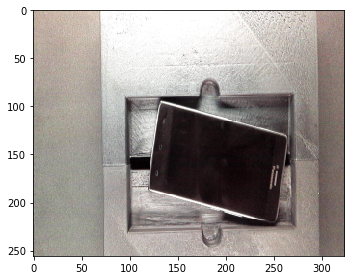

(1, 256, 324, 1)


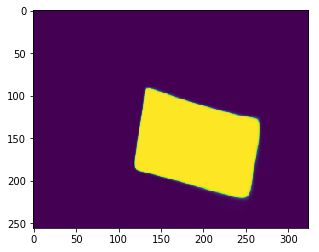

(13068, 3)


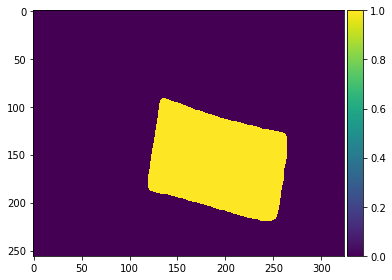

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


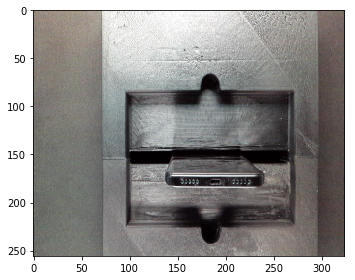

(1, 256, 324, 1)


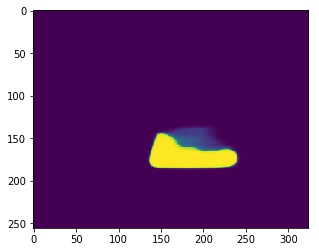

(2471, 3)


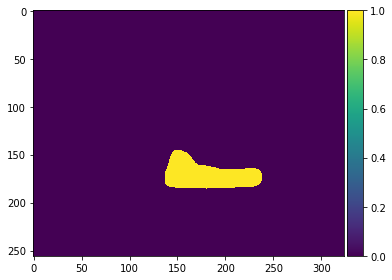

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


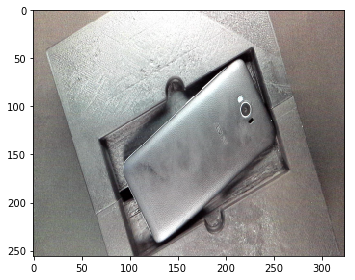

(1, 256, 324, 1)


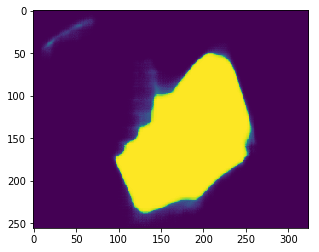

(17664, 3)


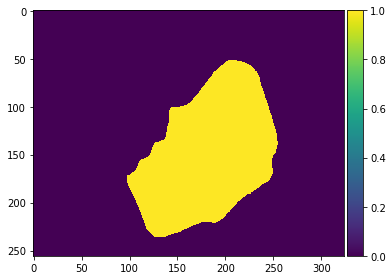

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


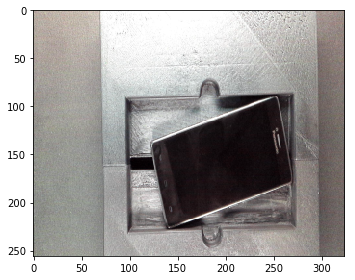

(1, 256, 324, 1)


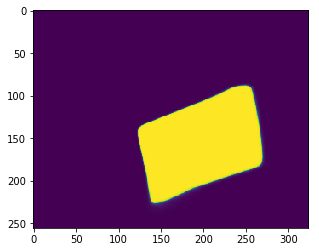

(13100, 3)


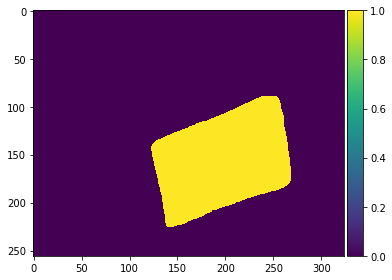

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.9490196 0.0
(1, 256, 324, 3)


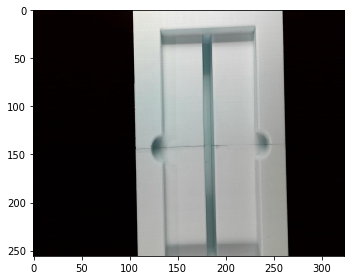

(1, 256, 324, 1)


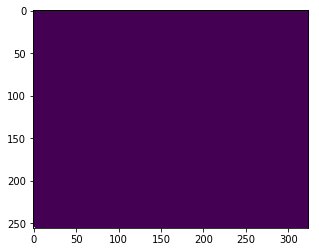

(0, 3)


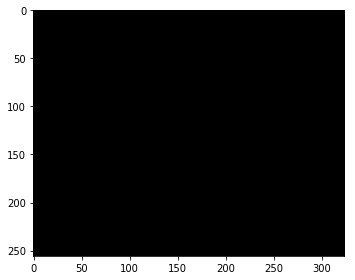

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


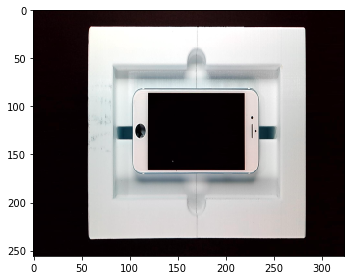

(1, 256, 324, 1)


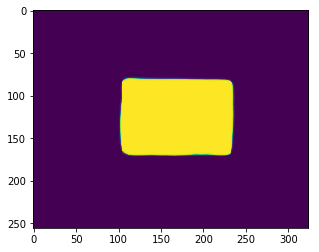

(11528, 3)


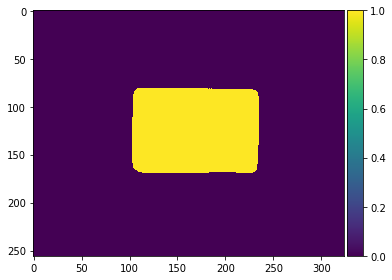

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


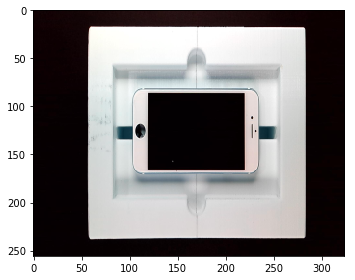

(1, 256, 324, 1)


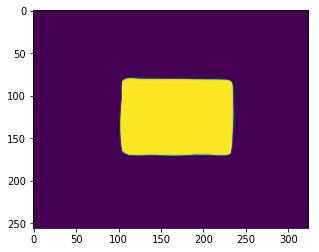

(11520, 3)


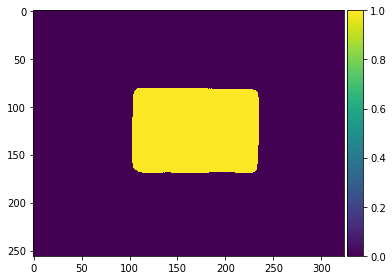

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


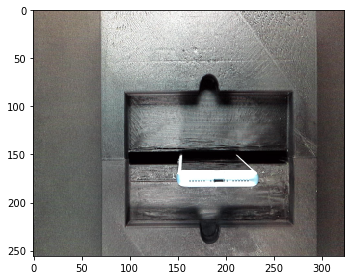

(1, 256, 324, 1)


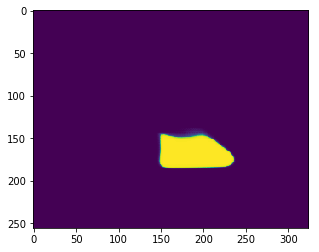

(2700, 3)


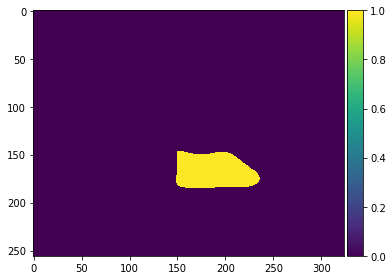

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.8627451 0.0
(1, 256, 324, 3)


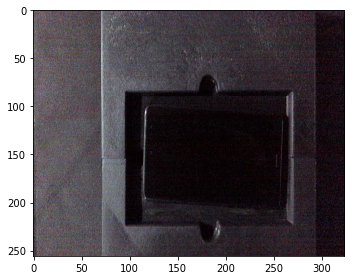

(1, 256, 324, 1)


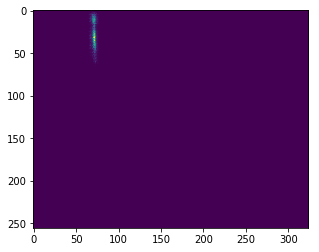

(0, 3)


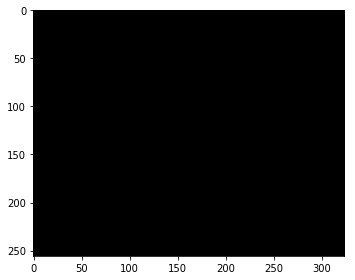

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


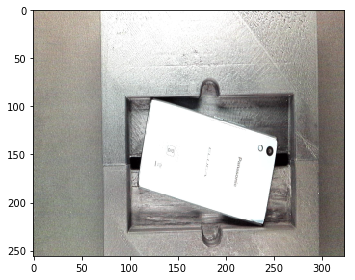

(1, 256, 324, 1)


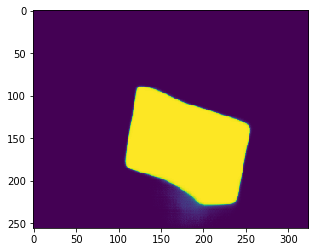

(13613, 3)


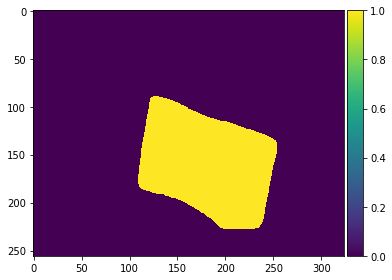

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


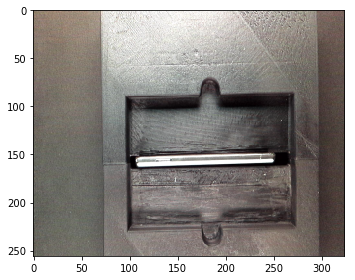

(1, 256, 324, 1)


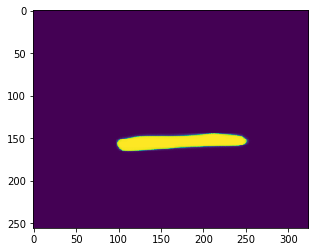

(2005, 3)


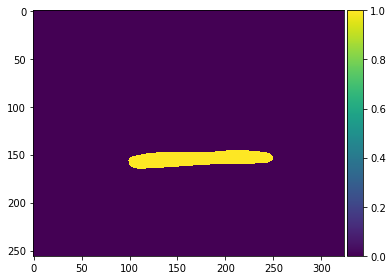

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.9411765 0.0
(1, 256, 324, 3)


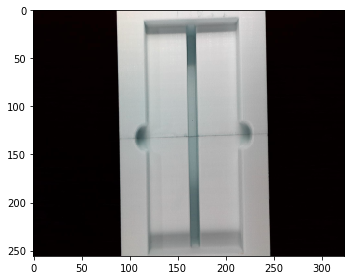

(1, 256, 324, 1)


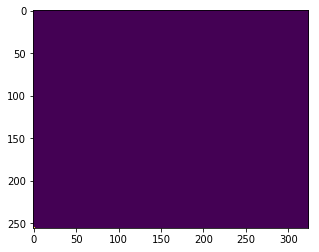

(0, 3)


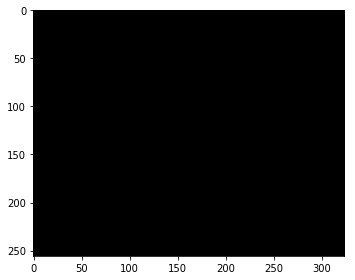

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


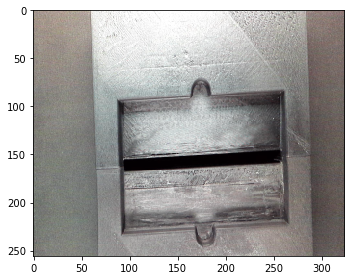

(1, 256, 324, 1)


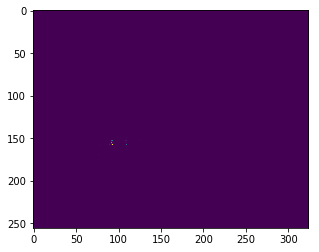

(0, 3)


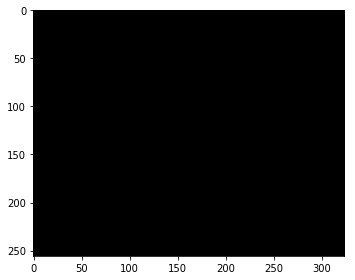

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


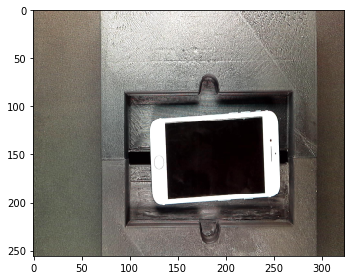

(1, 256, 324, 1)


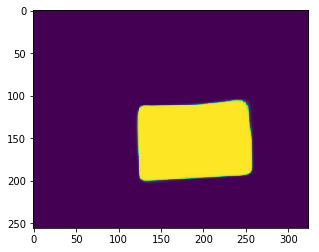

(11305, 3)


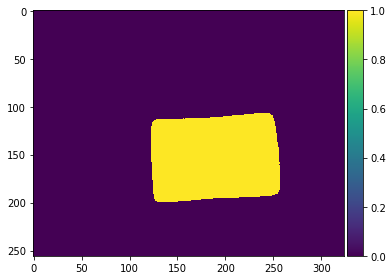

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.9490196 0.0
(1, 256, 324, 3)


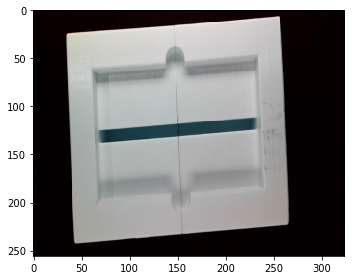

(1, 256, 324, 1)


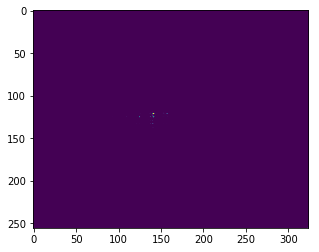

(0, 3)


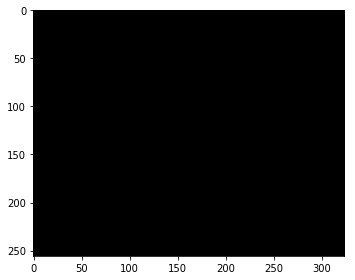

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.99215686 0.0
(1, 256, 324, 3)


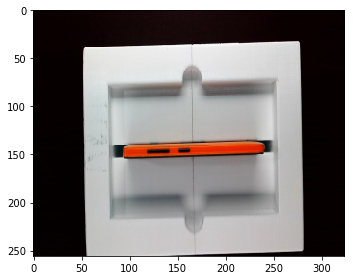

(1, 256, 324, 1)


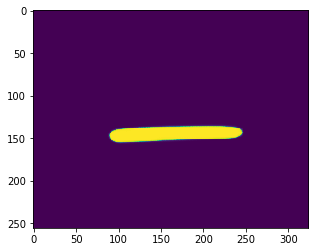

(2235, 3)


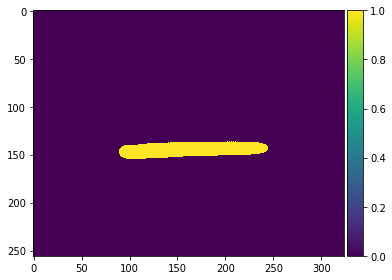

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


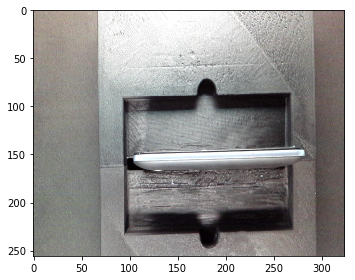

(1, 256, 324, 1)


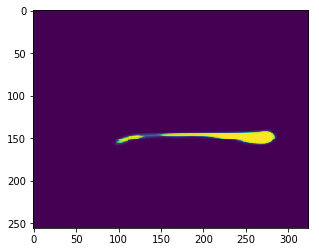

(886, 3)


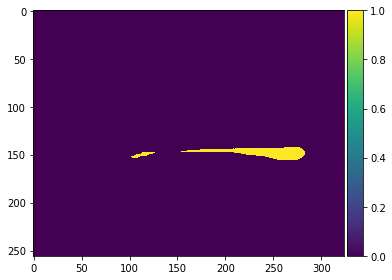

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


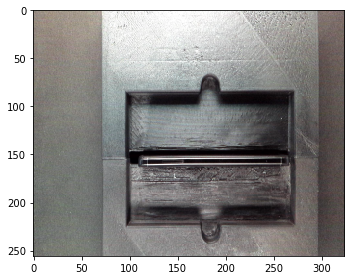

(1, 256, 324, 1)


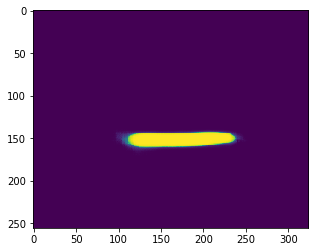

(1693, 3)


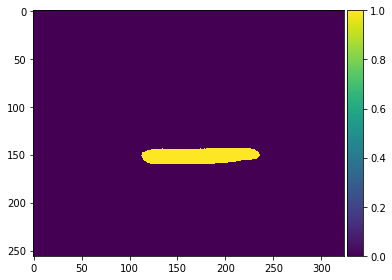

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


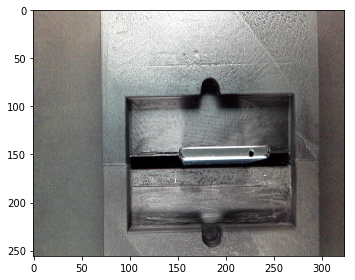

(1, 256, 324, 1)


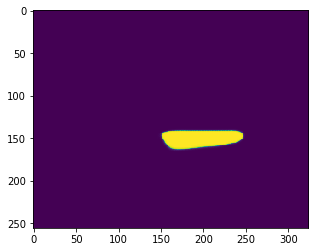

(1596, 3)


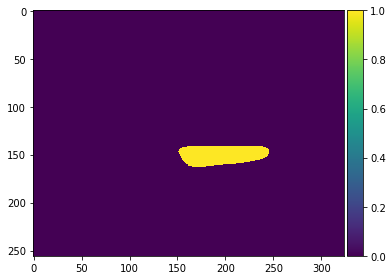

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


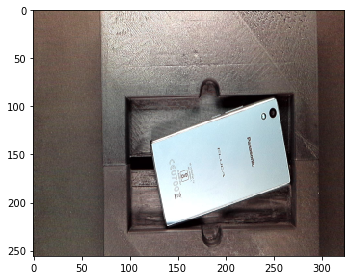

(1, 256, 324, 1)


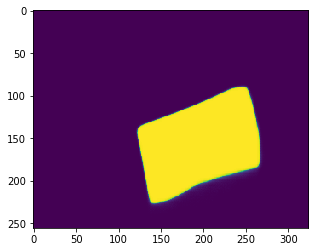

(12704, 3)


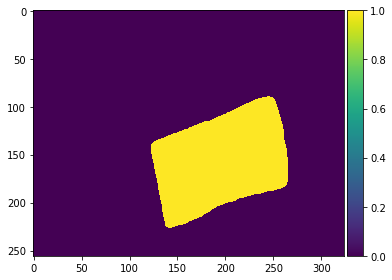

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


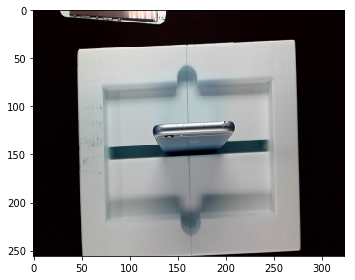

(1, 256, 324, 1)


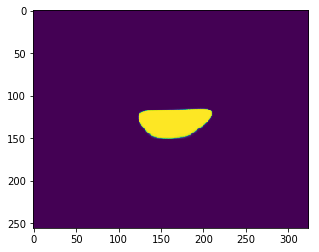

(2243, 3)


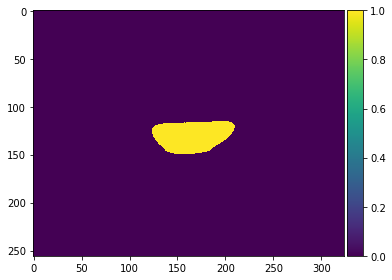

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


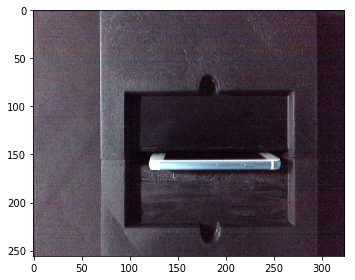

(1, 256, 324, 1)


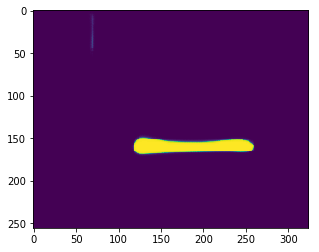

(1755, 3)


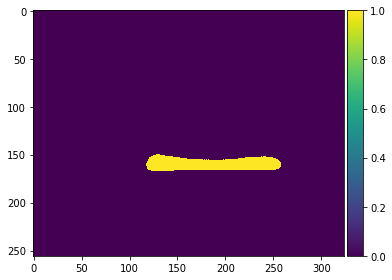

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


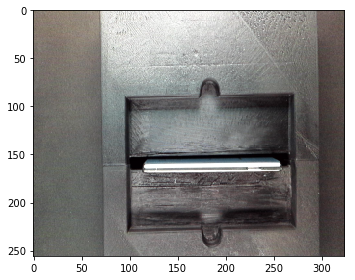

(1, 256, 324, 1)


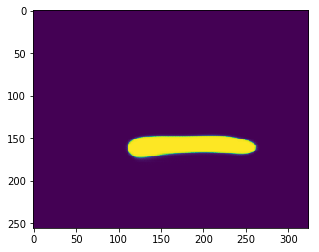

(2778, 3)


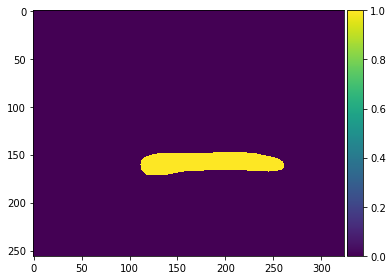

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


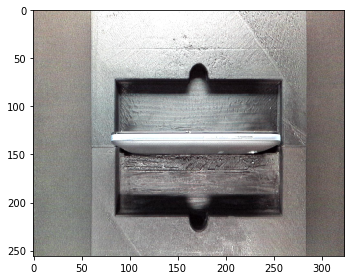

(1, 256, 324, 1)


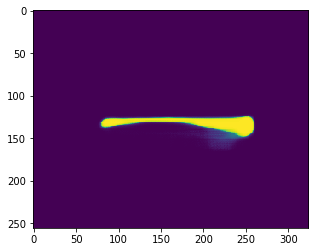

(1521, 3)


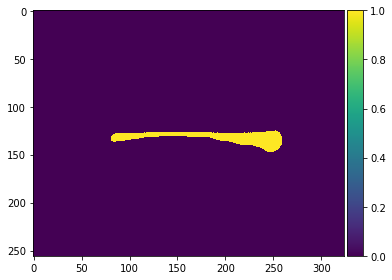

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


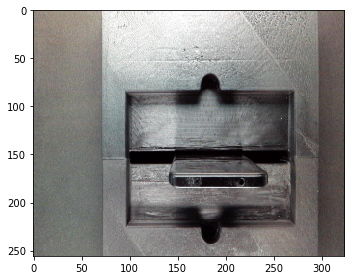

(1, 256, 324, 1)


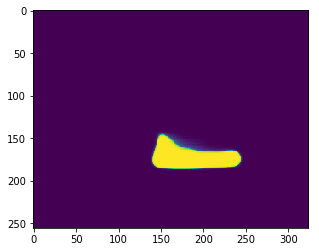

(2324, 3)


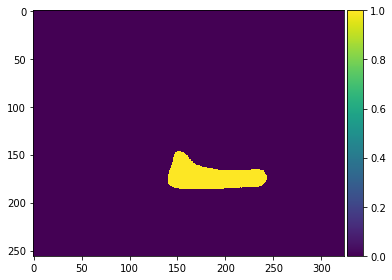

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


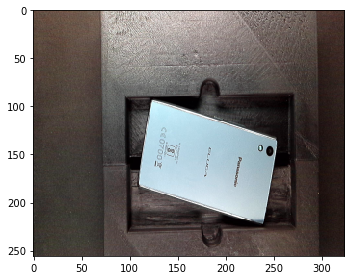

(1, 256, 324, 1)


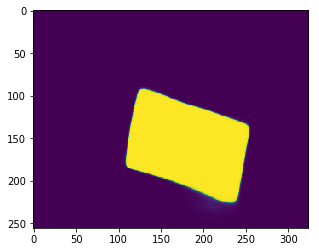

(12756, 3)


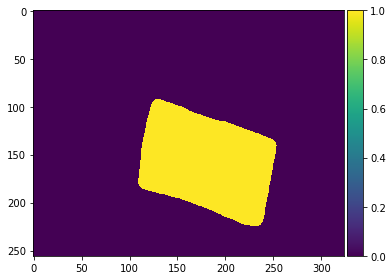

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


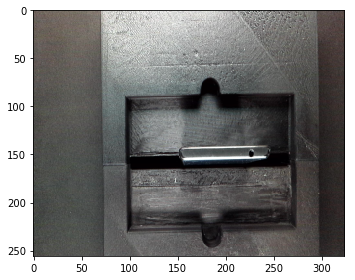

(1, 256, 324, 1)


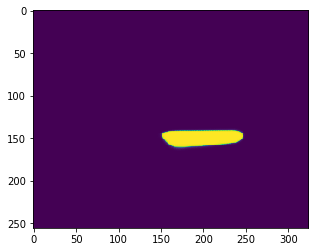

(1449, 3)


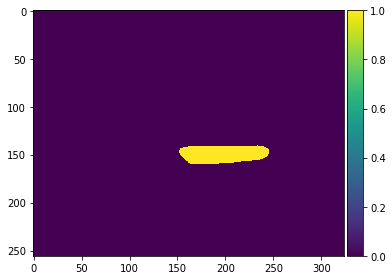

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


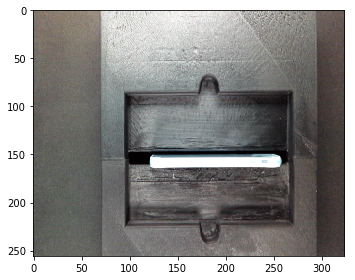

(1, 256, 324, 1)


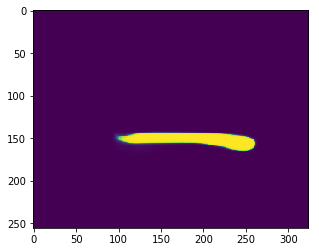

(1865, 3)


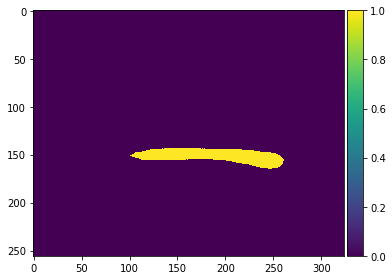

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


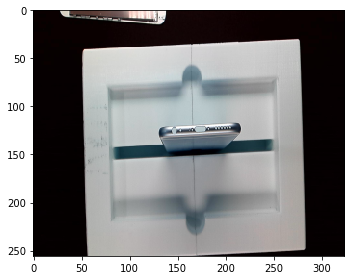

(1, 256, 324, 1)


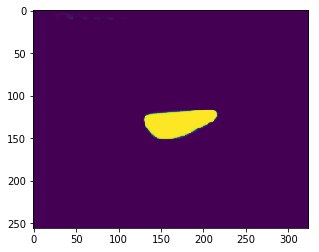

(1953, 3)


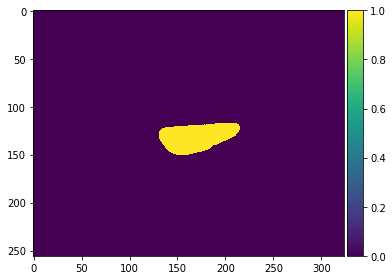

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


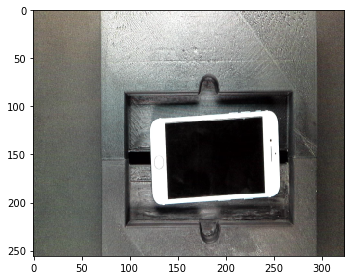

(1, 256, 324, 1)


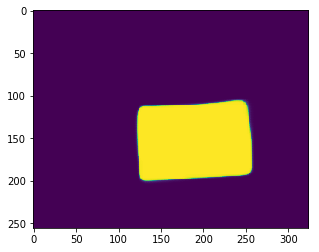

(11307, 3)


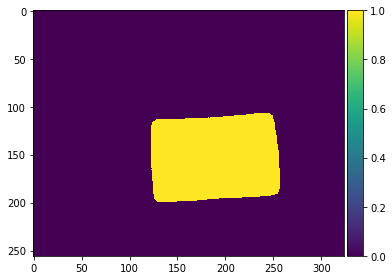

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


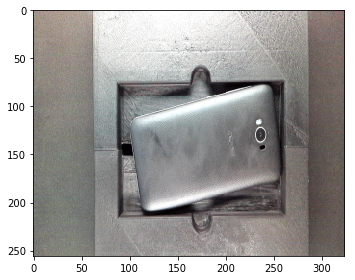

(1, 256, 324, 1)


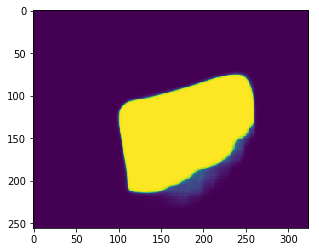

(15027, 3)


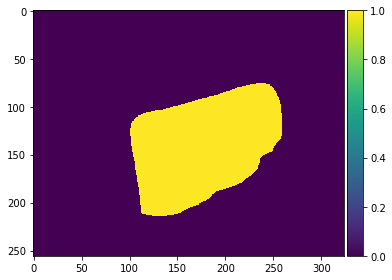

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


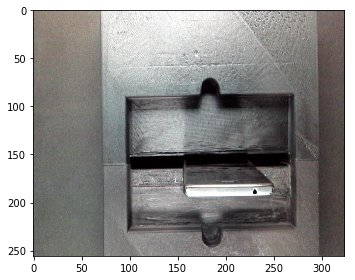

(1, 256, 324, 1)


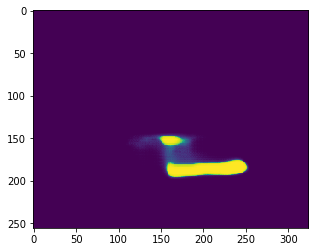

(1445, 3)


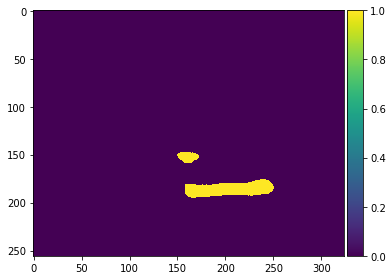

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


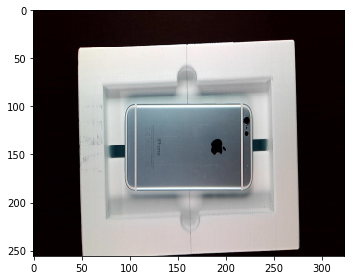

(1, 256, 324, 1)


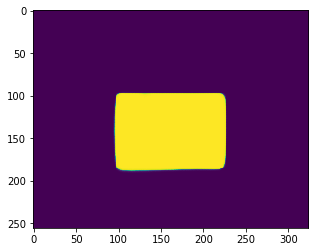

(11503, 3)


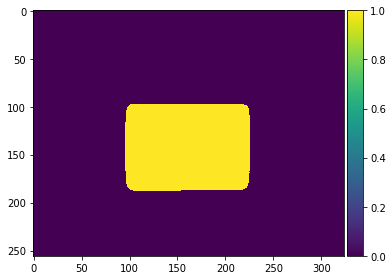

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


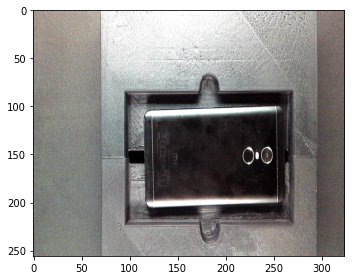

(1, 256, 324, 1)


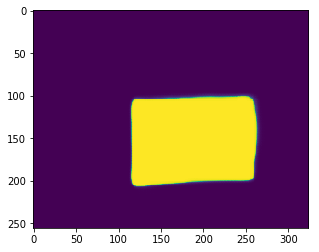

(14254, 3)


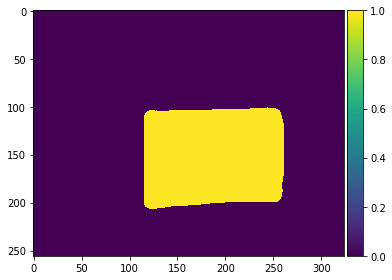

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.96862745 0.0
(1, 256, 324, 3)


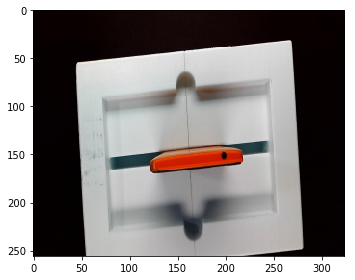

(1, 256, 324, 1)


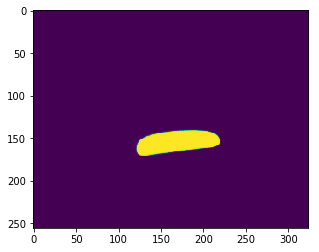

(1989, 3)


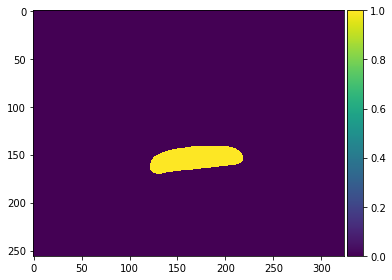

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.0
(1, 256, 324, 3)


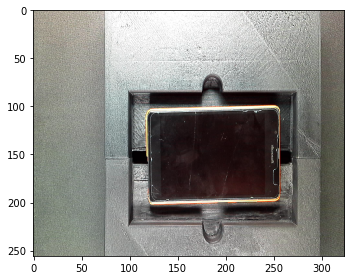

(1, 256, 324, 1)


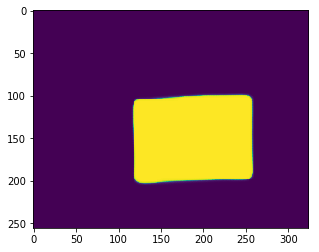

(13571, 3)


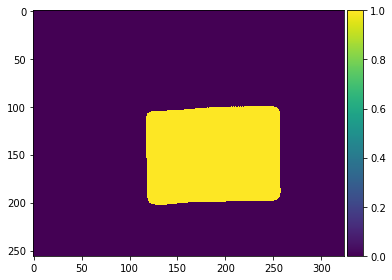

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
0.94509804 0.0
(1, 256, 324, 3)


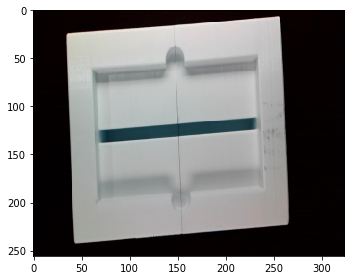

(1, 256, 324, 1)


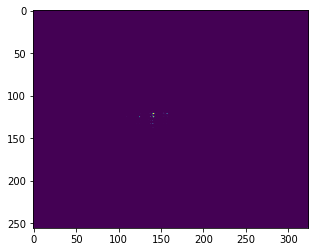

(0, 3)


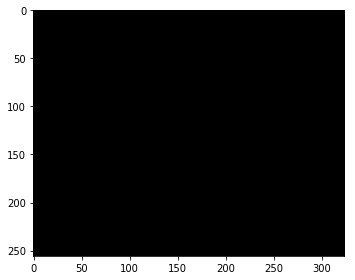

(1080, 1920, 3)
(256, 324, 3)
(1, 256, 324, 3)
1.0 0.003921569
(1, 256, 324, 3)


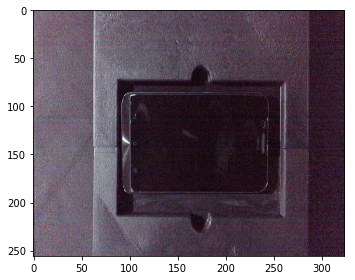

(1, 256, 324, 1)


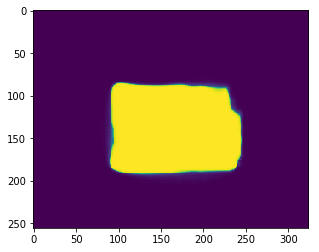

(14669, 3)


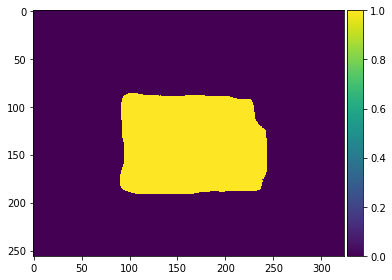

In [8]:
from skimage import io as skio
import matplotlib.pyplot as io
from glob import glob
import cv2
no=183
testPath = glob('/home/ubuntu/DeepMobile/data/NewData4/JPEGImages/train/**')
def FillImg(binImg,rgbImg):
    _, contours, hierarchy = cv2.findContours(np.uint8(binImg), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    newBinImg = np.zeros((binImg.shape[0],binImg.shape[1]),np.uint8())
    
    areas = [cv2.contourArea(c) for c in contours]
    if(len(areas)>0):
        max_index = np.argmax(areas)
        cnt = contours[max_index]
        cv2.drawContours(np.uint8(newBinImg), [cnt], 0, 1, -1)
        rect = cv2.minAreaRect(cnt)
        angle = rect[-1]
        box = cv2.boxPoints(rect)
        # self.box = np.int0(cv2.cv.BoxPoints(rect))
        box = np.int0(box)
        cv2.drawContours(rgbImg, [box], 0, (0,255,0), 2)
        print(box.shape[0])
        croppedRgbImg = rgbImg[int(min(box[:, 1])):int(max(box[:, 1])), int(min(box[:, 0])):int(max(box[:, 0]))]
        if croppedRgbImg.shape[0]>0:
            return newBinImg,croppedRgbImg
        else:
            return newBinImg,np.zeros((256,324,3))
for i in range(len(testPath)):
    #tokens = testPath[i].split('/)
    #name = tokens[6].split('.')[0]
    img = cv2.imread(testPath[i],3)
    #imgOriginal = cv2.resize(img,dsize=(4128,3096),interpolation=cv2.INTER_AREA)
    print(img.shape)
    
    
    #img = cv2.cvtColor(img,cv2.COLOR_GRAY2RGB)
    
    img = cv2.resize(img,dsize=(324,256),interpolation=cv2.INTER_AREA)
    imgss = img
    img = np.asarray(img).astype('float32')
    print(img.shape)
    #label = cv.resize(label,dsize=(324,256))

    #label = label.astype('uint8')
    img = img.reshape(1,256,324,3)

    print(img.shape)

    img = img/255.
    print(np.max(img),np.min(img))
    #label = label.reshape(512,648,1)
    print(img.shape)
    skio.imshow(img[0])
    skio.show()
    #img = (img-np.mean(img))/np.std(img)
    predicted = model1.predict(img)
    print(predicted.shape)
    io.imshow(predicted[0,:,:,0])
    io.show()
    thresh = np.argwhere(predicted[:,:,:,0]>0.87)
    imgs = np.zeros((256,324,1)).astype('uint8')
    print(thresh.shape)
    for j in range(thresh.shape[0]):
        imgs[thresh[j][1],thresh[j][2],0]=1

    imgs = imgs.reshape(256,324)
    skio.imshow(imgs)
    skio.show()
    '''imgs = cv2.resize(imgs,(4128,3096),interpolation=cv2.INTER_AREA)
    imgBin,imgRgb = FillImg(binImg=np.uint8(imgs),rgbImg=np.uint8(imgOriginal))
    print(imgRgb.shape)
    skio.imshow(imgRgb)
    skio.show()
    skio.imshow(imgBin.reshape(3096,4128,1)*imgOriginal)'''
    '''skio.show()
    io.imsave('/home/ubuntu/DeepMobile/data/outputData/original/{}'.format(int(no)),imgOriginal)
    io.imsave('/home/ubuntu/DeepMobile/data/outputData/cropped/{}'.format(int(no)),imgRgb)
    io.imsave('/home/ubuntu/DeepMobile/data/outputData/segmented/{}'.format(int(no)),imgBin.reshape(3096,4128,1)*imgOriginal)
    no+=1'''

In [10]:
import cv2
cv2.namedWindow("preview")
vc = cv2.VideoCapture(0)

if vc.isOpened(): # try to get the first frame
    rval, frame = vc.read()
else:
    rval = False

while rval:
    
    rval, frame = vc.read()
    key = cv2.waitKey(20)
    if key == 27: # exit on ESC
        break
    #img = np.asarray(img).astype('float32')
    img = cv2.resize(frame,dsize=(324,256),interpolation=cv2.INTER_AREA)

    #label = cv.resize(label,dsize=(324,256))

    #label = label.astype('uint8')
    imgss = img
    img = img.reshape(1,256,324,3)
    
    img = img/255.
    #label = label.reshape(512,648,1)

    
    #img = (img-np.mean(img))/np.std(img)
    predicted = model1.predict(img)
 
    
    thresh = np.argwhere(predicted[:,:,:,0]>0.9)
    imgs = np.zeros((256,324,1)).astype('uint8')
   
    for i in range(thresh.shape[0]):
        imgs[thresh[i][1],thresh[i][2],0]=255
    #imgBin,imgRgb = FillImg(binImg=np.uint8(imgs),rgbImg=np.uint8(imgss))
    cv2.imshow("preview", imgs)

cv2.destroyWindow("preview")
    

In [ ]:
model.save_weights('VGG1.h5')

In [ ]:
data_gen_args = dict(height_shift_range=0.1,width_shift_range=0.1,fill_mode='nearest',horizontal_flip=True,vertical_flip=True,
                     rotation_range=90.,
                     )
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

# Provide the same seed and keyword arguments to the fit and flow methods
seed = 1


# combine generators into one which yields image and masks
train_generator = zip(image_datagen.flow(x=x[:100],batch_size=1,seed=10), mask_datagen.flow(x=y[:100],batch_size=1,seed=10))
valid_generator = zip(image_datagen.flow(x=x[100:],batch_size=1,seed=10), mask_datagen.flow(x=y[100:],batch_size=1,seed=10))
'''model1.fit_generator(callbacks=[checkpoint],validation_data=valid_generator,validation_steps=90,
    generator=train_generator,
    steps_per_epoch=100,
    epochs=100)'''

In [ ]:
model.save_weights('/home/ubuntu/DeepMobile/models/myown/VGGNEWNEW.h5')

In [ ]:
model.save(filepath='/home/ubuntu/DeepMobile/models/fcn/VGGPredict')

In [ ]:
no

In [ ]:
hist = model1.evaluate(batch_size=1,x=trains,y=labelss,verbose=1)

In [ ]:
hist[2]

In [ ]:
labelss = labelss.reshape(1314,1,256,256)

In [ ]:
io.imshow(trains[0])

In [ ]:
from skimage import io

In [ ]:
model1.save('/home/ubuntu/DeepMobile/models/fully_trained_models/VGG_MUE')

In [ ]:
json_string = model1.to_json()

In [ ]:
json_string

In [ ]:
model_json = model1.to_json()
with open("/home/ubuntu/DeepMobile/models/production_models/VGG_MUE_Production.json", "w") as json_file:
    json_file.write(model_json)

In [ ]:
model1.save_weights('/home/ubuntu/DeepMobile/models/production_models/VGG_MUE_Production.h5')

In [ ]:
json_string = json.encoder(json_string)

In [ ]:
import json